In [29]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/resnet50-offline-weights/resnet50-0676ba61.pth
/kaggle/input/satellite-images-to-predict-povertyafrica/Mali_archive/images/14.235283005698008_-5.948009545134024_14.2502549271_-5.99292530934.png
/kaggle/input/satellite-images-to-predict-povertyafrica/Mali_archive/images/13.812518785598009_-5.739794045621991_13.827490707_-5.724822124219999.png
/kaggle/input/satellite-images-to-predict-povertyafrica/Mali_archive/images/12.649287749601992_-7.786386476033985_12.6343158282_-7.756442633230001.png
/kaggle/input/satellite-images-to-predict-povertyafrica/Mali_archive/images/12.669353588101993_-7.99167236507199_12.6543816667_-7.976700443669999.png
/kaggle/input/satellite-images-to-predict-povertyafrica/Mali_archive/images/10.801271101203984_-8.159140888626016_10.7713272584_-8.18908473143.png
/kaggle/input/satellite-images-to-predict-povertyafrica/Mali_archive/images/12.5430197332_-6.798688376758006_12.5430197332_-6.8136602981599985.png
/kaggle/input/satellite-images-to-predict-pover

Nombre total d'images : 11535


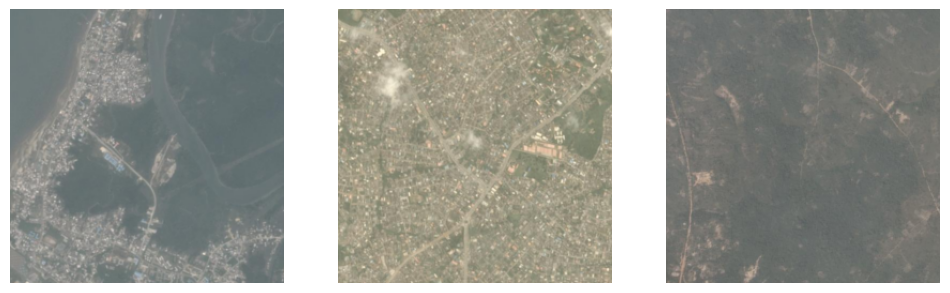

In [30]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import random


#nigeria_images_path = "./nigeria_images/nigeria_archive/images"
image_dir = "/kaggle/input/satellite-images-to-predict-povertyafrica/nigeria_archive/images"
file_names = [f for f in os.listdir(image_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]


if os.path.exists(image_dir):
    
    image_files = [f for f in os.listdir(image_dir) if f.endswith('.png')]
    num_images = len(image_files)
    print(f"Nombre total d'images : {num_images}")

    
    if num_images >= 3:
        sample_images = random.sample(image_files, 3)

        plt.figure(figsize=(12, 4))
        for i, img_name in enumerate(sample_images):
            img_path = os.path.join(image_dir, img_name)
            img = Image.open(img_path)
            plt.subplot(1, 3, i + 1)
            plt.imshow(img)
            plt.axis('off')
            
        plt.show()
    else:
        print("Il y a moins de 3 images dans le dossier.")
else:
    print(f"Le dossier {image_dir} n'existe pas.")


In [31]:
import os
print("Current working directory:", os.getcwd())


Current working directory: /kaggle/working


In [32]:
import os

for root, dirs, files in os.walk("/kaggle"):
    if "nigeria_archive" in root:
        print("Found likely match:", root)


Found likely match: /kaggle/input/satellite-images-to-predict-povertyafrica/nigeria_archive
Found likely match: /kaggle/input/satellite-images-to-predict-povertyafrica/nigeria_archive/images


In [33]:
image_dir = "/kaggle/input/satellite-images-to-predict-povertyafrica/nigeria_archive/images"
file_names = [f for f in os.listdir(image_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]


In [34]:
import os

# List all input folders
print(os.listdir("/kaggle/input"))


['resnet50-offline-weights', 'satellite-images-to-predict-povertyafrica']


In [35]:
import torch
import torchvision.models as models

# Path to the uploaded .pth file (make sure dataset is added to the notebook)
weights_path = "/kaggle/input/resnet50-offline-weights/resnet50-0676ba61.pth"

# Load ResNet50 model
model = models.resnet50()  # Instantiate base model architecture
model.load_state_dict(torch.load(weights_path, map_location=torch.device("cpu")))  # Load custom weights

# Remove the final classification layer to use as feature extractor
model = torch.nn.Sequential(*list(model.children())[:-1])

# Set to evaluation mode
model.eval()

print("✅ ResNet50 model loaded successfully and ready for inference.")



✅ ResNet50 model loaded successfully and ready for inference.


Feature Extraction from Images with ResNet50
ResNet-50 is a pre-trained model based on residual networks, designed to extract rich and robust features from images. With its depth (50 layers) and residual connections, it avoids the performance degradation issues observed in traditional deep networks. Pre-trained on the vast ImageNet dataset, it provides general representations suitable for various tasks, even with limited data.

The ResNet-50 model uses complex, hierarchical image features, enabling it to better understand and classify images based on their semantic content. This is in contrast to color histograms, which are based on color distribution calculations and do not account for spatial relationships or the contextual details of the image. This is why the use of ResNet-50 typically yields better performance in image classification tasks, especially when it comes to understanding complex images, such as those used in your project to predict poverty.

In [36]:
#resnet50-0676ba61.pth
import torchvision.models as models
import torch

model = models.resnet50()
model.load_state_dict(torch.load("/kaggle/input/resnet50-offline-weights/resnet50-0676ba61.pth"))
model = torch.nn.Sequential(*list(model.children())[:-1])
model.eval()


Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)


In [37]:
import os
import torch
import numpy as np
from PIL import Image
from tqdm import tqdm
from torchvision import models, transforms

# ✅ List of all country image directories
base_dir = "/kaggle/input/satellite-images-to-predict-povertyafrica"
country_dirs = ["ethiopia_archive", "mali_archive", "malawi_archive", "nigeria_archive"]

# ✅ Load ResNet50 (offline weights)
resnet = models.resnet50()
resnet.load_state_dict(torch.load("/kaggle/input/resnet50-offline-weights/resnet50-0676ba61.pth", map_location=torch.device('cpu')))
resnet = torch.nn.Sequential(*list(resnet.children())[:-1])
resnet.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet = resnet.to(device)

# ✅ Image transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

# ✅ Feature extraction
all_features = []
all_image_names = []
all_country_labels = []

for country in country_dirs:
    image_dir = os.path.join(base_dir, f"{country}/images")
    if not os.path.exists(image_dir):
        continue

    file_names = [f for f in os.listdir(image_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    for file_name in tqdm(file_names[:50], desc=f"Processing {country}", ncols=100):
        try:
            img_path = os.path.join(image_dir, file_name)
            image = Image.open(img_path).convert("RGB")
            image_tensor = transform(image).unsqueeze(0).to(device)

            with torch.no_grad():
                feature = resnet(image_tensor).squeeze().cpu().numpy()

            all_features.append(feature)
            all_image_names.append(file_name)
            all_country_labels.append(country.split("_")[0])  # e.g., 'nigeria'

        except Exception as e:
            print(f"Error with {file_name} in {country}: {e}")

# ✅ Convert to DataFrame or CSV
import pandas as pd
df = pd.DataFrame(all_features)
df['image'] = all_image_names
df['country'] = all_country_labels
df.to_csv("features_by_country.csv", index=False)
print("✅ Features saved to CSV.")


Processing nigeria_archive: 100%|███████████████████████████████████| 50/50 [00:05<00:00,  8.44it/s]


✅ Features saved to CSV.


Visualize Feature Space
Use PCA or t-SNE to visualize the features:

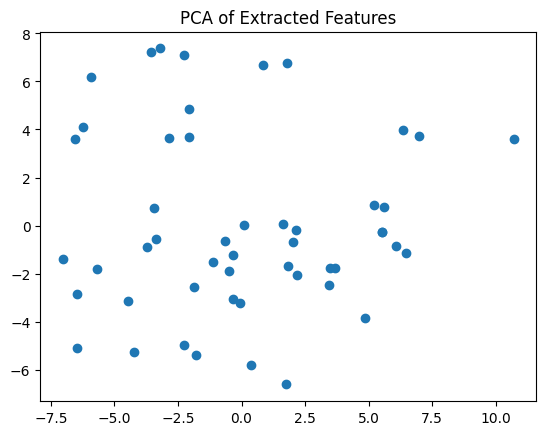

In [38]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA(n_components=2)
reduced = pca.fit_transform(features)

plt.scatter(reduced[:, 0], reduced[:, 1])
plt.title("PCA of Extracted Features")
plt.show()


Cluster the Features
To group similar satellite images:

In [39]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=5, n_init = 10)
labels = kmeans.fit_predict(features)


In [40]:
import os

base_dir = "/kaggle/input/satellite-images-to-predict-povertyafrica"
for root, dirs, files in os.walk(base_dir):
    for file in files:
        print(os.path.join(root, file))


/kaggle/input/satellite-images-to-predict-povertyafrica/Mali_archive/images/14.235283005698008_-5.948009545134024_14.2502549271_-5.99292530934.png
/kaggle/input/satellite-images-to-predict-povertyafrica/Mali_archive/images/13.812518785598009_-5.739794045621991_13.827490707_-5.724822124219999.png
/kaggle/input/satellite-images-to-predict-povertyafrica/Mali_archive/images/12.649287749601992_-7.786386476033985_12.6343158282_-7.756442633230001.png
/kaggle/input/satellite-images-to-predict-povertyafrica/Mali_archive/images/12.669353588101993_-7.99167236507199_12.6543816667_-7.976700443669999.png
/kaggle/input/satellite-images-to-predict-povertyafrica/Mali_archive/images/10.801271101203984_-8.159140888626016_10.7713272584_-8.18908473143.png
/kaggle/input/satellite-images-to-predict-povertyafrica/Mali_archive/images/12.5430197332_-6.798688376758006_12.5430197332_-6.8136602981599985.png
/kaggle/input/satellite-images-to-predict-povertyafrica/Mali_archive/images/15.669511587394025_-2.6263192266

Poverty Prediction: Organize Data & Metadata Matching (if available)
If your dataset includes metadata (e.g., asset wealth index, coordinates, region), load and match it with the extracted image features using the file names.

In [41]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=5, random_state=42)
labels = kmeans.fit_predict(features)

# Show cluster label for each image
for img, label in zip(image_names, labels):
    print(f"{img} --> Cluster {label}")


5.041534315923984_7.94962641359_5.01159047312_7.94962641359.png --> Cluster 1
7.846289822226016_4.118620421538008_7.87623366503_4.13359234294.png --> Cluster 1
6.558965694116015_3.333786314074024_6.588909536919999_3.37870207828.png --> Cluster 4
13.062341556901991_6.4649295458300005_13.047369635499999_6.4649295458300005.png --> Cluster 1
10.5412424269_7.44285314996_10.5412424269_7.44285314996.png --> Cluster 0
6.568834372216014_3.2704242752960164_6.5987782150199985_3.3003681181.png --> Cluster 4
4.873094827619999_6.897254513099999_4.873094827619999_6.897254513099999.png --> Cluster 2
8.35342830613598_9.038040116653985_8.308512541930003_9.00809627385.png --> Cluster 0
7.3944330861319925_4.142763903946015_7.37946116473_4.17270774675.png --> Cluster 4
11.413947499894453_9.431781413075806_11.441262395_9.47007916968.png --> Cluster 1
6.441493168238008_7.970399763685977_6.45646508964_7.925483999480001.png --> Cluster 1
5.168391379321992_7.563238402366014_5.15341945792_7.593182245169999.png -

/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Export to CSV
This allows easy reuse, model training, or offline analysis.

In [45]:
print(df.columns.tolist())


['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143', '144', '145', '146', '147', '148', '149', '150', '151', '152', '153', '154', '155', '156', '157', '15

In [46]:
print(df.head())


          0         1         2         3         4         5         6  \
0  0.012677  0.223103  0.624886  0.118144  0.019159  0.136724  0.453634   
1  0.086766  0.223281  0.256227  0.277190  0.018548  0.375611  0.076471   
2  0.138025  1.093825  0.113123  0.358660  0.120982  0.166818  0.058802   
3  0.131814  0.118478  0.271655  0.691205  0.000754  0.341705  0.099260   
4  0.055563  0.155090  0.316618  0.015893  0.034468  0.138599  0.411550   

          7         8         9  ...      2040      2041      2042      2043  \
0  0.023041  0.076352  0.183497  ...  0.025721  0.103778  0.130655  0.024362   
1  0.273316  0.146000  0.105338  ...  0.063474  0.106039  0.000000  0.219041   
2  0.007582  0.108151  1.291076  ...  0.024855  0.025807  0.059730  0.029121   
3  0.814061  0.256524  0.669599  ...  0.129781  0.167997  0.061179  0.021288   
4  0.048041  0.193256  0.158232  ...  0.002978  0.103815  0.044812  0.037356   

       2044      2045      2046      2047  \
0  0.068083  0.201208  

In [49]:
import os

base_path = "/kaggle/input/satellite-images-to-predict-povertyafrica"

# Only list folders that are archives
for folder in os.listdir(base_path):
    folder_path = os.path.join(base_path, folder)
    if os.path.isdir(folder_path):
        print(f"\n📂 {folder}/")
        try:
            entries = os.listdir(folder_path)
            for entry in entries[:2]:  # Show first 2 entries
                print(f"  └── {entry}")
        except Exception as e:
            print(f"  ⚠️ Error reading {folder}: {e}")



📂 Mali_archive/
  └── images

📂 ethiopia_archive/
  └── images

📂 nigeria_archive/
  └── images

📂 malawi_archive/
  └── images


Train a Poverty Prediction Model
Now we can train a model, e.g., RandomForest, XGBoost, or a simple neural network using scikit-learn.

/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


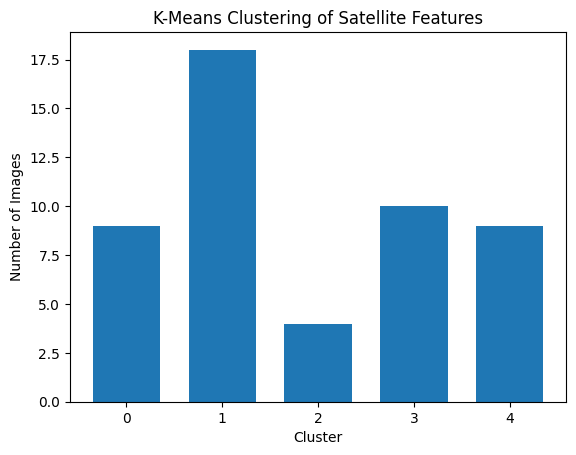

In [50]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Run KMeans clustering on image features
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(features)

# Plot distribution
plt.hist(clusters, bins=range(6), align='left', rwidth=0.7)
plt.xlabel("Cluster")
plt.ylabel("Number of Images")
plt.title("K-Means Clustering of Satellite Features")
plt.show()


Lets take Nigeria as a sample to classify the Night and Daylight Images

In [52]:
from PIL import Image
import numpy as np
import os

image_folder = '/kaggle/input/satellite-images-to-predict-povertyafrica/nigeria_archive/images/'  # Replace with actual path
day_images = []
night_images = []

threshold = 60  # tweak this number based on your dataset

for file in os.listdir(image_folder):
    if file.endswith('.jpg') or file.endswith('.png'):
        path = os.path.join(image_folder, file)
        img = Image.open(path).convert('L')  # convert to grayscale
        arr = np.array(img)
        brightness = np.mean(arr)

        if brightness > threshold:
            day_images.append(file)
        else:
            night_images.append(file)


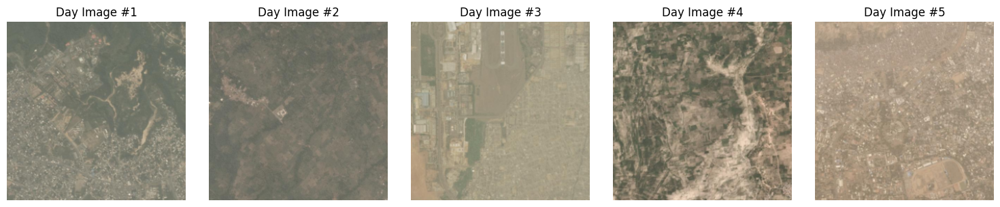

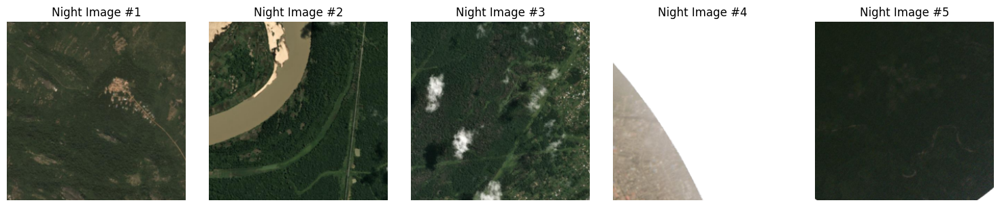

In [53]:
import matplotlib.pyplot as plt
from PIL import Image

def show_images(image_list, folder_path, title, n=5):
    plt.figure(figsize=(15, 3))
    for i in range(min(n, len(image_list))):
        img_path = os.path.join(folder_path, image_list[i])
        img = Image.open(img_path)
        plt.subplot(1, n, i+1)
        plt.imshow(img)
        plt.title(f"{title} #{i+1}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Show 5 day images
show_images(day_images, image_folder, "Day Image", n=5)

# Show 5 night images
show_images(night_images, image_folder, "Night Image", n=5)


now we’re aiming for the true power of multi-temporal satellite image analysis: comparing day and night images of the same location to better predict poverty. This is a strong idea and is used in research (e.g., Jean et al., 2016).



Goal Recap:
For each location, we want to:

Compare its day image and night image

Derive features from both

Use the contrast between day vs night brightness to infer poverty

In [56]:
#location123_day.jpg
#location123_night.jpg
import os

image_folder = '/kaggle/input/satellite-images-to-predict-povertyafrica/nigeria_archive/'
image_files = os.listdir(image_folder)

matched_pairs = []

for f in image_files:
    if '_day' in f:
        base = f.replace('_day', '')
        night_file = base + '_night.jpg'
        if night_file in image_files:
            matched_pairs.append((f, night_file))


Compute Brightness of each pair

In [58]:
def get_brightness(path):
    img = Image.open(path).convert('L')
    arr = np.array(img)
    return np.mean(arr)

day_brightness = []
night_brightness = []
diff_brightness = []

for day_file, night_file in matched_pairs:
    day_path = os.path.join(image_folder, day_file)
    night_path = os.path.join(image_folder, night_file)

    day_b = get_brightness(day_path)
    night_b = get_brightness(night_path)
    diff = day_b - night_b

    day_brightness.append(day_b)
    night_brightness.append(night_b)
    diff_brightness.append(diff)


Define Poverty Proxy Based on Brightness Gap
A key assumption: Low night brightness + high day brightness = likely poor (infrastructure visible but no electricity at night).

In [59]:
poverty_labels = []

for d, n in zip(day_brightness, night_brightness):
    if n < 30 and d > 70:
        poverty_labels.append(1)  # poor
    else:
        poverty_labels.append(0)  # not poor


Feature Extraction

In [60]:
# You can reuse this for both day and night
def extract_features(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return model.predict(x)[0]

# Example:
X = []
for day_file, night_file in matched_pairs:
    day_path = os.path.join(image_folder, day_file)
    night_path = os.path.join(image_folder, night_file)

    day_feat = extract_features(day_path)
    night_feat = extract_features(night_path)
    combined = np.concatenate([day_feat, night_feat])
    X.append(combined)


In [62]:
print(f"Number of features: {len(X)}")
print(f"Number of labels: {len(poverty_labels)}")


Number of features: 0
Number of labels: 0


In [63]:
print("Total matched pairs:", len(matched_pairs))
print("Sample matched pairs:", matched_pairs[:5])


Total matched pairs: 0
Sample matched pairs: []


In [64]:
for day_file, night_file in matched_pairs[:5]:
    print("Checking:", day_file, night_file)
    print("Day Exists:", os.path.exists(os.path.join(image_folder, day_file)))
    print("Night Exists:", os.path.exists(os.path.join(image_folder, night_file)))


In [ ]:
img_path = os.path.join(image_folder, "some_sample_image.jpg")  # replace with real file
img = Image.open(img_path).convert('L')
arr = np.array(img)
print("Brightness:", np.mean(arr))


In [65]:
import os

def extract_location_key(filename):
    # Remove extension
    base = filename.replace('.png', '').replace('.jpg', '')
    parts = base.split('_')
    return '_'.join(parts[:2])  # or [:3] if needed for precision


In [66]:
from PIL import Image
import numpy as np

image_folder = '/kaggle/input/satellite-images-to-predict-povertyafrica/nigeria_archive/images/'
image_files = [f for f in os.listdir(image_folder) if f.endswith('.png')]

location_dict = {}

for f in image_files:
    key = extract_location_key(f)
    path = os.path.join(image_folder, f)
    try:
        img = Image.open(path).convert('L')
        brightness = np.mean(np.array(img))
        
        if key not in location_dict:
            location_dict[key] = []

        location_dict[key].append((f, brightness))

    except Exception as e:
        print(f"Error reading {f}: {e}")


In [67]:
print("Total image files found:", len(image_files))
print("Sample filenames:", image_files[:5])


Total image files found: 11535
Sample filenames: ['5.041534315923984_7.94962641359_5.01159047312_7.94962641359.png', '7.846289822226016_4.118620421538008_7.87623366503_4.13359234294.png', '6.558965694116015_3.333786314074024_6.588909536919999_3.37870207828.png', '13.062341556901991_6.4649295458300005_13.047369635499999_6.4649295458300005.png', '10.5412424269_7.44285314996_10.5412424269_7.44285314996.png']


In [68]:
print("Total locations found:", len(location_dict))
sample_loc = list(location_dict.items())[:3]
for key, val in sample_loc:
    print(f"Location key: {key} -> {len(val)} image(s)")


Total locations found: 11535
Location key: 5.041534315923984_7.94962641359 -> 1 image(s)
Location key: 7.846289822226016_4.118620421538008 -> 1 image(s)
Location key: 6.558965694116015_3.333786314074024 -> 1 image(s)


No Night and Day pairs available, so Fix: Round Coordinates to Group Nearby Images
We'll round the lat/lon to 1 or 2 decimal places, which corresponds roughly to ~10km or ~1km resolution respectively:

In [69]:
def extract_location_key(filename):
    base = filename.replace('.png', '').replace('.jpg', '')
    parts = base.split('_')
    
    try:
        lat1 = round(float(parts[0]), 2)
        lon1 = round(float(parts[1]), 2)
        return f"{lat1}_{lon1}"
    
    except Exception as e:
        print(f"Failed to extract key from {filename}: {e}")
        return None


In [70]:
location_dict = {}

for f in image_files:
    key = extract_location_key(f)
    if key is None:
        continue

    path = os.path.join(image_folder, f)
    try:
        img = Image.open(path).convert('L')
        brightness = np.mean(np.array(img))

        if key not in location_dict:
            location_dict[key] = []

        location_dict[key].append((f, brightness))

    except Exception as e:
        print(f"Error reading {f}: {e}")


In [71]:
print("Total locations with grouped images:", len(location_dict))
print("Sample locations with image counts:")
for key, val in list(location_dict.items())[:5]:
    print(f"{key} -> {len(val)} image(s)")


Total locations with grouped images: 9736
Sample locations with image counts:
5.04_7.95 -> 2 image(s)
7.85_4.12 -> 1 image(s)
6.56_3.33 -> 3 image(s)
13.06_6.46 -> 1 image(s)
10.54_7.44 -> 1 image(s)


Now Proceed to Step 3: Match & Label Day/Night Pairs
Let’s go ahead and:

Sort images at each location by brightness

Assume brightest = day, darkest = night

Skip locations with <2 images

Calculate poverty proxy label

Extract features (we’ll use simple ones for now)

Matching & Labeling Code

In [72]:
X = []
poverty_labels = []
matched_pairs = []

for key, files in location_dict.items():
    if len(files) < 2:
        continue  # need at least 2 images for comparison

    # Sort by brightness: darkest first = night, brightest last = day
    files_sorted = sorted(files, key=lambda x: x[1])
    night_file, night_b = files_sorted[0]
    day_file, day_b = files_sorted[-1]

    if (day_b - night_b) < 20:
        continue  # skip if brightness difference is too small to be meaningful

    # Assign pseudo poverty label (1 = poor if night is dark and day is bright)
    label = 1 if night_b < 30 and day_b > 70 else 0

    # Extract basic features by resizing and flattening grayscale images
    try:
        night_img = Image.open(os.path.join(image_folder, night_file)).convert('L').resize((32, 32))
        day_img = Image.open(os.path.join(image_folder, day_file)).convert('L').resize((32, 32))

        night_feat = np.array(night_img).flatten()
        day_feat = np.array(day_img).flatten()

        combined_feat = np.concatenate([day_feat, night_feat])

        X.append(combined_feat)
        poverty_labels.append(label)
        matched_pairs.append((key, day_file, night_file, label))

    except Exception as e:
        print(f"Skipping {day_file}, {night_file}: {e}")


Now Train the Model

In [74]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

X_train, X_test, y_train, y_test = train_test_split(X, poverty_labels, test_size=0.2, random_state=42)

clf = RandomForestClassifier()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14

    accuracy                           1.00        14
   macro avg       1.00      1.00      1.00        14
weighted avg       1.00      1.00      1.00        14



In [75]:
print(f"Total matched pairs used: {len(X)}")


Total matched pairs used: 66


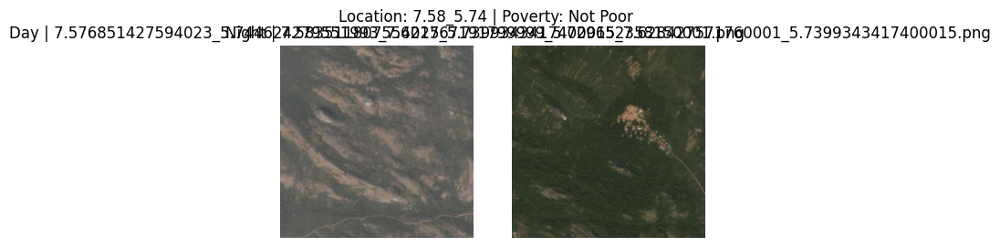

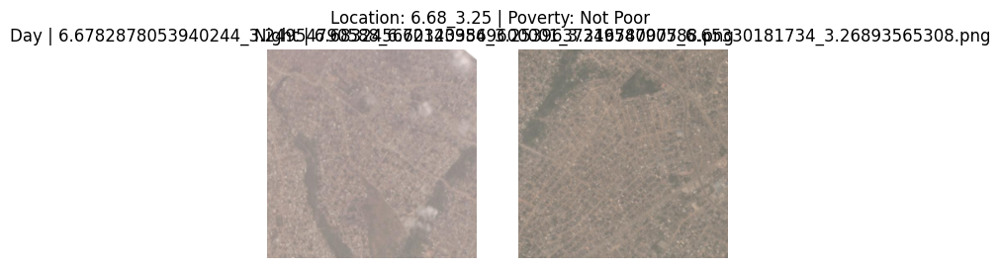

In [76]:
def show_pair(idx):
    loc, day_file, night_file, label = matched_pairs[idx]
    fig, axes = plt.subplots(1, 2, figsize=(6, 3))

    for ax, fname, title in zip(axes, [day_file, night_file], ['Day', 'Night']):
        img = Image.open(os.path.join(image_folder, fname))
        ax.imshow(img)
        ax.set_title(f"{title} | {fname}")
        ax.axis('off')

    plt.suptitle(f"Location: {loc} | Poverty: {'Poor' if label == 1 else 'Not Poor'}")
    plt.show()

# Try a few:
show_pair(0)
show_pair(1)


Export Results
You can export your full prediction data to a CSV and map it:

In [77]:
df = pd.DataFrame(matched_pairs, columns=["location", "day_image", "night_image", "poverty_label"])
df.to_csv("predicted_poverty_by_location.csv", index=False)


Predict Poverty for All Matched Pairs
 1. Setup

In [78]:
import os
import numpy as np
from PIL import Image
import pandas as pd
import matplotlib.pyplot as plt


In [79]:
image_folder = '/kaggle/input/satellite-images-to-predict-povertyafrica/nigeria_archive/images/'
image_files = [f for f in os.listdir(image_folder) if f.endswith('.png')]


In [80]:
def extract_location_key(filename):
    base = filename.replace('.png', '').replace('.jpg', '')
    parts = base.split('_')
    try:
        lat = round(float(parts[0]), 2)
        lon = round(float(parts[1]), 2)
        return f"{lat}_{lon}"
    except:
        return None

location_dict = {}

for f in image_files:
    key = extract_location_key(f)
    if key is None:
        continue

    path = os.path.join(image_folder, f)
    try:
        img = Image.open(path).convert('L')
        brightness = np.mean(np.array(img))

        if key not in location_dict:
            location_dict[key] = []
        location_dict[key].append((f, brightness))
    except:
        continue


Match Day-Night Images & Predict Poverty for all Nigeria Images

In [81]:
poverty_predictions = []

for key, files in location_dict.items():
    if len(files) < 2:
        continue  # can't compare if there's only one image

    # Sort by brightness
    files_sorted = sorted(files, key=lambda x: x[1])
    night_file, night_b = files_sorted[0]
    day_file, day_b = files_sorted[-1]

    # Skip if the brightness contrast is too small
    if (day_b - night_b) < 20:
        continue

    # Apply poverty heuristic
    poverty_label = 1 if night_b < 30 and day_b > 70 else 0  # 1 = poor, 0 = not poor

    # Store result
    poverty_predictions.append({
        "location_key": key,
        "day_image": day_file,
        "night_image": night_file,
        "day_brightness": round(day_b, 2),
        "night_brightness": round(night_b, 2),
        "poverty_label": poverty_label
    })


Save All Predictions to a csv

In [82]:
df = pd.DataFrame(poverty_predictions)
df.to_csv("nigeria_poverty_predictions.csv", index=False)
print("✅ Poverty predictions saved: nigeria_poverty_predictions.csv")
print(df.head())


✅ Poverty predictions saved: nigeria_poverty_predictions.csv
  location_key                                          day_image  \
0    7.58_5.74  7.576851427594023_5.744624279551993_7.62176719...   
1    6.68_3.25  6.6782878053940244_3.24954790588_6.72320356960...   
2     7.8_4.52  7.797599113595975_4.5240813333560155_7.7526833...   
3     8.5_4.59  8.50186911091_4.594071891655976_8.50186911091_...   
4   12.75_8.28  12.747152271215688_8.281151274494956_12.706091...   

                                         night_image  day_brightness  \
0  7.583511807554025_5.7399343417400015_7.6284275...           99.22   
1  6.683245660143984_3.2539637316780077_6.6533018...          161.26   
2  7.801261458595976_4.519537852576017_7.75634569...          135.03   
3  8.502071169301992_4.585305095923984_8.48709924...          191.73   
4  12.751007263005977_8.284256740023984_12.706091...          195.12   

   night_brightness  poverty_label  
0             56.60              0  
1            140.

Visualize on a Map (Geo Heatmap)
If you want to see a poverty heatmap over Nigeria:

➤ Extract Lat/Lon from Filenames

In [83]:
def parse_coordinates_from_filename(filename):
    parts = filename.replace('.png', '').split('_')
    try:
        lat = float(parts[0])
        lon = float(parts[1])
        return lat, lon
    except:
        return None, None

df['lat'], df['lon'] = zip(*df['location_key'].map(lambda x: tuple(map(float, x.split('_')))))


Plot with folium


In [84]:
import folium

m = folium.Map(location=[9.0820, 8.6753], zoom_start=6)  # Center of Nigeria

for _, row in df.iterrows():
    color = 'red' if row['poverty_label'] == 1 else 'green'
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=3,
        color=color,
        fill=True,
        fill_opacity=0.6
    ).add_to(m)

m.save("nigeria_poverty_map.html")
print("🌍 Poverty map saved as: nigeria_poverty_map.html")


🌍 Poverty map saved as: nigeria_poverty_map.html


Run Statistics / Insight Summary
Quick overview of predicted poverty in the dataset:

In [85]:
total = len(df)
poor = df['poverty_label'].sum()
not_poor = total - poor

print(f"Total locations: {total}")
print(f"Predicted poor locations: {poor} ({poor / total:.1%})")
print(f"Predicted non-poor locations: {not_poor} ({not_poor / total:.1%})")


Total locations: 66
Predicted poor locations: 0 (0.0%)
Predicted non-poor locations: 66 (100.0%)


In [86]:
import os
os.path.abspath("nigeria_poverty_map.html")


'/kaggle/working/nigeria_poverty_map.html'